In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.dataloader import default_collate
from xml.etree.ElementTree import Element as ET_Element
from torchvision.datasets.voc import VOCDetection
from collections import Counter
import matplotlib.patches as patches
from torchvision import datasets, transforms, models
import torch.nn as nn
from torchvision.models.resnet import ResNet18_Weights  # Import the specific weights enum for ResNet18
import xml.etree.ElementTree as ET
from torch.utils.data import Dataset
from torchvision.transforms import ColorJitter
from torchvision.transforms import v2

In [2]:
# this call is done only when working with .ipynb
%load_ext tensorboard

In [3]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('logs')

In [97]:
# this call is done only when working with .ipynb
%tensorboard --logdir logs


<IPython.core.display.Javascript object>

In [5]:
# Check CUDA availability
print(f"Is CUDA available: {torch.cuda.is_available()}")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


Is CUDA available: True
cuda


In [6]:
# Custom collate function to handle the variable sizes of images and annotations
def custom_collate(batch):
    images = [item[0] for item in batch]  # Assuming item[0] is the image
    annotations = [item[1] for item in batch]  # Assuming item[1] is the annotation
    images = default_collate(images)
    return images, annotations


# Transforms for training dataset, with color augmentation
train_transform = transforms.Compose([
    transforms.Resize((224, 224)), # ResNet18 expects 224x224 images
    v2.RandomGrayscale(p=0.2),
    v2.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
    v2.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Transforms for validation/testing dataset, without color augmentation
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)), # ResNet18 expects 224x224 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

**Data Loading and preprocess**

In [7]:
# Load the PASCal VOC 2012 dataset using the VOCDetection class with separate transforms
voc2012_trainset = VOCDetection('./data/VOC2012', year='2012', image_set='train', download=True, transform=train_transform)
voc2012_testset = VOCDetection('./data/VOC2012', year='2012', image_set='val', download=True, transform=val_test_transform)

# Dataloaders for VOC2012 with custom collate function
trainloader = torch.utils.data.DataLoader(voc2012_trainset, batch_size=4, shuffle=True, num_workers=2, collate_fn=custom_collate)
testloader = torch.utils.data.DataLoader(voc2012_testset, batch_size=4, shuffle=True, num_workers=2, collate_fn=custom_collate)


Using downloaded and verified file: ./data/VOC2012/VOCtrainval_11-May-2012.tar
Extracting ./data/VOC2012/VOCtrainval_11-May-2012.tar to ./data/VOC2012
Using downloaded and verified file: ./data/VOC2012/VOCtrainval_11-May-2012.tar
Extracting ./data/VOC2012/VOCtrainval_11-May-2012.tar to ./data/VOC2012


In [8]:
def visualize_with_labels(data_loader, num_images=6):
    images, annotations = next(iter(data_loader))  # Get a batch of images and annotations
    num_images = min(num_images, len(images))

    # The target size to which images are resized
    target_size = (224, 224)

    fig = plt.figure(figsize=(8, 8))
    for idx in range(num_images):
        ax = fig.add_subplot(1, 4, idx+1, xticks=[], yticks=[])
        img = images[idx].numpy().transpose((1, 2, 0))
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Unnormalize
        img = np.clip(img, 0, 1)
        ax.imshow(img)

        # Original image dimensions (before resizing)
        original_size = annotations[idx]['annotation']['size']
        original_width = int(original_size['width'])
        original_height = int(original_size['height'])

        # Scale factors for width and height
        scale_x = target_size[0] / original_width
        scale_y = target_size[1] / original_height

        # Iterate over each object to draw its bounding box
        for obj in annotations[idx]['annotation']['object']:
            bbox = obj['bndbox']
            xmin = int(bbox['xmin']) * scale_x
            ymin = int(bbox['ymin']) * scale_y
            xmax = int(bbox['xmax']) * scale_x
            ymax = int(bbox['ymax']) * scale_y
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        class_names = get_class_names(annotations[idx])
        ax.set_title("\n".join(class_names), fontsize=10, pad=20)

    plt.tight_layout()
    plt.show()

def get_class_names(annotation):
    # This function should be adapted if you need to count objects or parts specifically
    class_names = [obj['name'] for obj in annotation['annotation']['object']]
    # Here you could add logic to count objects and format names as requested
    count_names = Counter(class_names)
    formatted_class_names = [f"{count} - {name}" if count > 1 else name for name, count in count_names.items()]
    return formatted_class_names

In [9]:
# Preprocess the dataset
def filter_dataset_for_single_object(voc_dataset):
    single_object_dataset_items = []
    for i in range(len(voc_dataset)):
        img, target = voc_dataset[i]
        # Check if there is only one object in the image
        if len(target["annotation"]["object"]) == 1:
          if target["annotation"]["object"][0]["name"] == "train" or target["annotation"]["object"][0]["name"] == "aeroplane":
            single_object_dataset_items.append((img, target))

    return single_object_dataset_items

In [10]:
# Assuming voc2012_trainset and voc2012_testset are already defined
filtered_trainset_items = filter_dataset_for_single_object(voc2012_trainset)
filtered_testset_items = filter_dataset_for_single_object(voc2012_testset)

In [11]:
# Now, we create custom Datasets using the filtered items

class CustomVOCDataset(Dataset):
    def __init__(self, dataset_items):
        self.dataset_items = dataset_items

    def __len__(self):
        return len(self.dataset_items)

    def __getitem__(self, idx):
        return self.dataset_items[idx]

# Initialize the custom datasets
filtered_trainset = CustomVOCDataset(filtered_trainset_items)
filtered_testset = CustomVOCDataset(filtered_testset_items)

In [12]:
# Update the DataLoaders
trainloader = torch.utils.data.DataLoader(filtered_trainset, batch_size=4, shuffle=True, num_workers=2, collate_fn=custom_collate)
testloader = torch.utils.data.DataLoader(filtered_testset, batch_size=4, shuffle=True, num_workers=2, collate_fn=custom_collate)

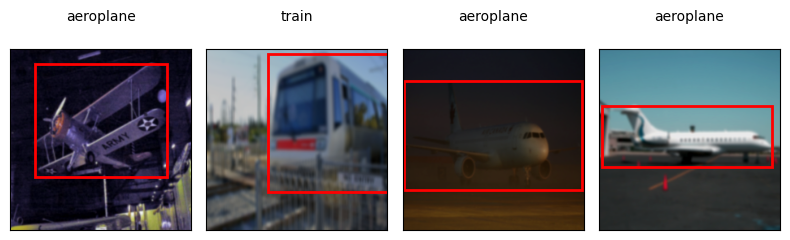

In [ ]:
# Visualize images with labels
visualize_with_labels(trainloader, num_images=4)

**Model initalization**

In [13]:
class SingleBoxResNet18(nn.Module):
    def __init__(self, num_classes):
        super(SingleBoxResNet18, self).__init__()
        # Load the pre-trained ResNet-18 model
        self.resnet = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        self.resnet.fc = nn.Identity()

        # Get the number of input features for the classification and bounding box heads
        num_features = self._get_num_features()

        # Classification head
        self.classification_head = nn.Linear(num_features, num_classes)

        # Bounding box regression head
        self.bbox_head = nn.Linear(num_features, 4)  # Outputting only one set of bounding box coordinates

    def forward(self, x):
        # Forward pass through ResNet-18 backbone
        features = self.resnet(x)

        # Classification predictions
        classification_output = self.classification_head(features)

        # Bounding box prediction
        bbox_output = self.bbox_head(features)  # Outputting only one set of bounding box coordinates

        return classification_output, bbox_output

    def _get_num_features(self):
        # Perform a forward pass to get the number of input features for the classification and bounding box heads
        with torch.no_grad():
            features = self.resnet(torch.zeros(1, 3, 224, 224))  # Pass a dummy input through the network
            return features.size(1)  # Return the number of features (channels) after the backbone

# Example usage
num_classes = 2
model = SingleBoxResNet18(num_classes)


In [91]:
# Load and modify ResNet18
model = SingleBoxResNet18(num_classes=2)
model = model.to(device)

# Log model graph of TensorBoard
images, _ = next(iter(trainloader))
writer.add_graph(model, images.to(device))
# Loss function and optimizer
cls_criterion = nn.CrossEntropyLoss()
bbox_criterion = nn.SmoothL1Loss()
# optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.0005)
# optimizer = optim.Adam(model.parameters(), lr=0.001)

voc_classes = ['train', 'aeroplane']

In [15]:
def annotations_to_labels(annotation):
    # Extracting object names from the annotation
    objects = annotation['annotation'].get('object', [])

    labels = []
    for obj in objects:
        object_name = obj['name']
        try:
            label_index = voc_classes.index(object_name)
            labels.append(label_index)
        except ValueError:
            continue

    return labels

def annotations_to_bbox(annotation):
    original_size = annotation['annotation']['size']
    target_size = (224, 224)
    original_width = int(original_size['width'])
    original_height = int(original_size['height'])

    # Scale factors for width and height
    scale_x = target_size[0] / original_width
    scale_y = target_size[1] / original_height

    # Assuming there's only one object in the annotation
    bbox = annotation['annotation']['object'][0]['bndbox']
    xmin = int(bbox['xmin']) * scale_x
    ymin = int(bbox['ymin']) * scale_y
    xmax = int(bbox['xmax']) * scale_x
    ymax = int(bbox['ymax']) * scale_y

    # Return bounding box coordinates as a tuple (xmin, ymin, xmax, ymax)
    return (xmin, ymin, xmax, ymax)

In [16]:
def visualize_predictions(model, data_loader, voc_classes, num_images=6):
    model.eval()  # Set the model to evaluation mode
    images, annotations = next(iter(data_loader))  # Get a batch of images and their annotations
    images = images.to(device)
    cls_outputs, bbox_outputs = model(images)  # Get the model's predictions

    # The target size to which images are resized
    target_size = (224, 224)

    fig = plt.figure(figsize=(20, 12))
    for idx in range(min(num_images, len(images))):
        ax = fig.add_subplot(1, 4, idx+1, xticks=[], yticks=[])
        img = images[idx].cpu().numpy().transpose((1, 2, 0))
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Unnormalize
        img = np.clip(img, 0, 1)
        ax.imshow(img)

        # Original image dimensions (before resizing)
        original_size = annotations[idx]['annotation']['size']
        original_width = int(original_size['width'])
        original_height = int(original_size['height'])

        # Scale factors for width and height
        scale_x = target_size[0] / original_width
        scale_y = target_size[1] / original_height

        # Draw bounding boxes and labels for true objects with scaled coordinates
        true_objects = annotations[idx]['annotation']['object']
        cls_pred_probs = torch.softmax(cls_outputs[idx], dim=0)  # Predicted class probabilities
        pred_confidence, _ = torch.max(cls_pred_probs, dim=0)  # Predicted class confidence and label index
        pred_confidence = pred_confidence.item()

        # Display the predicted class and bounding box
        cls_pred = torch.argmax(cls_outputs[idx]).item()

        if isinstance(cls_pred, int) and 0 <= cls_pred <= 1:
            pred_label = voc_classes[cls_pred]
        else:
            pred_label = 'Unknown'
        if pred_confidence >= 0.7:
          bbox_pred = bbox_outputs[idx].detach().cpu().numpy()  # Convert bbox_pred to numpy array
          xmin_pred, ymin_pred, xmax_pred, ymax_pred = bbox_pred
          rect_pred = patches.Rectangle((xmin_pred, ymin_pred), xmax_pred - xmin_pred, ymax_pred - ymin_pred, linewidth=2, edgecolor='r', facecolor='none')
          ax.add_patch(rect_pred)
          ax.text(0, -25, f'Pred Bbox: {bbox_pred}', color='blue', fontsize=10)
        ax.text(0, -15, f'Pred Class: {pred_label}', color='red', fontsize=10)


        true_names = [obj['name'] for obj in true_objects]
        true_labels = ', '.join(set(true_names))  # Remove duplicates and concatenate
        ax.set_title(f'True: {true_labels}', fontsize=10)
        ax.set_title(f'Confidence {pred_confidence}', fontsize=10)

    plt.tight_layout()
    plt.show()


In [17]:
def calculate_iou(bbox1, bbox2):
    # Extract coordinates of the intersection rectangle
    xmin = max(bbox1[0], bbox2[0])
    ymin = max(bbox1[1], bbox2[1])
    xmax = min(bbox1[2], bbox2[2])
    ymax = min(bbox1[3], bbox2[3])

    # Calculate area of intersection rectangle
    intersection_area = max(0, xmax - xmin + 1) * max(0, ymax - ymin + 1)

    # Calculate area of bounding boxes
    bbox1_area = (bbox1[2] - bbox1[0] + 1) * (bbox1[3] - bbox1[1] + 1)
    bbox2_area = (bbox2[2] - bbox2[0] + 1) * (bbox2[3] - bbox2[1] + 1)

    # Calculate area of union (sum of bbox1 area + bbox2 area - intersection area)
    union_area = bbox1_area + bbox2_area - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area if union_area > 0 else 0

    return iou


**Model evaluation function**

In [18]:
def evaluate_multi_label_accuracy(data_loader, model):
    model.eval()
    total_correct_cls = 0
    total_correct_bbox = 0
    total_images = 0  # Total images processed

    with torch.no_grad():
        for images, annotations in data_loader:
            images = images.to(device)
            cls_outputs, bbox_outputs = model(images)  # Shape: [batch_size, num_classes] for cls_outputs and [batch_size, 4] for bbox_outputs

            for idx, annotation in enumerate(annotations):
                actual_labels = set(annotations_to_labels(annotation))  # Set of actual label indices
                pred_cls_probs = torch.softmax(cls_outputs[idx], dim=0)  # Predicted class probabilities
                pred_cls_confidence, _ = torch.max(pred_cls_probs, dim=0)  # Predicted class confidence and label index
                pred_cls_confidence = pred_cls_confidence.item()
                pred_cls_label = torch.argmax(cls_outputs[idx]).item()  # Predicted class label index
                pred_bbox = bbox_outputs[idx]  # Predicted bounding box

                # Increment total_images for each image processed
                total_images += 1

                # Check classification accuracy
                if pred_cls_label in actual_labels:
                    total_correct_cls += 1

                # Extract true bounding box
                true_bbox = annotations_to_bbox(annotation)

                # Check bounding box accuracy (considering IoU)
                iou = calculate_iou(true_bbox, pred_bbox)
                if iou >= 0.4:  # Threshold for considering bounding box prediction as correct
                    total_correct_bbox += 1

    cls_accuracy = 100.0 * total_correct_cls / total_images
    bbox_accuracy = 100.0 * total_correct_bbox / total_images
    print(f'Classification Accuracy : {cls_accuracy:.2f}%')
    print(f'Bounding Box Accuracy : {bbox_accuracy:.2f}%')
    return cls_accuracy, bbox_accuracy

**Part A - result of a pre-trained model**

In [ ]:
print("Accuracy before training:")
evaluate_multi_label_accuracy(testloader , model)

Accuracy before training:
Classification Accuracy : 42.52%
Bounding Box Accuracy : 0.00%


(42.51968503937008, 0.0)

Predictions before training:


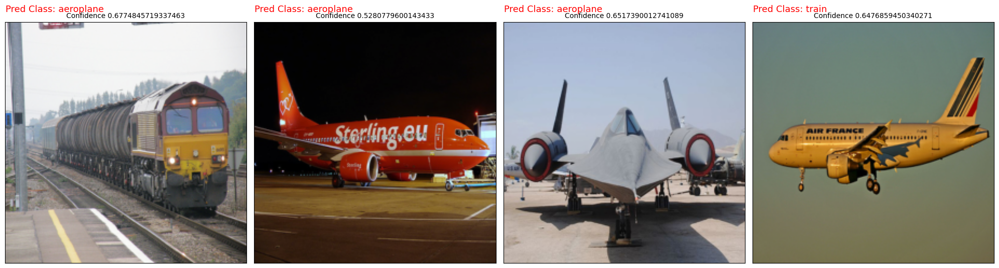

In [ ]:
# Visualize predictions before training
print("Predictions before training:")
visualize_predictions(model, testloader, voc_classes, num_images=6)


**Model training**

In [19]:
def train_model(model, trainloader, criterion_cls, criterion_bbox, optimizer, num_epochs, writer=None):
    model.train()
    for epoch in range(num_epochs):
        running_loss_cls = 0.0
        running_loss_bbox = 0.0
        count = 0
        for i, (images, annotations) in enumerate(trainloader):
            images = images.to(device)

            # Simplification: select the first label for each image for training
            labels = torch.tensor([annotations_to_labels(anno)[0] if annotations_to_labels(anno) else -1 for anno in annotations], dtype=torch.long).to(device)
            bboxes = torch.tensor([annotations_to_bbox(anno) if annotations_to_bbox(anno) else torch.zeros(4) for anno in annotations], dtype=torch.float32).to(device)

            # Filter out invalid labels (-1)
            valid_indices = labels >= 0
            if not valid_indices.any():
                continue  # Skip this batch if no valid labels
            valid_images = images[valid_indices]
            valid_labels = labels[valid_indices]
            valid_bboxes = bboxes[valid_indices]

            # Assuming each annotation contains a single bounding box
            # Adjust target bounding boxes to have shape [batch_size, 4]

            optimizer.zero_grad()
            outputs_cls, outputs_bbox = model(valid_images)

            loss_cls = criterion_cls(outputs_cls, valid_labels)
            loss_bbox = criterion_bbox(outputs_bbox, valid_bboxes)
            loss = loss_cls + loss_bbox
            loss.backward()
            optimizer.step()

            running_loss_cls += loss_cls.item()
            running_loss_bbox += loss_bbox.item()

            # Log training loss to TensorBoard every 10 batches
            if i % 10 == 9:
                step = epoch * len(trainloader) + i
                writer.add_scalar('classification_loss', running_loss_cls / 10, step)
                writer.add_scalar('bbox_loss', running_loss_bbox / 10, step)
                running_loss_cls = 0.0
                running_loss_bbox = 0.0


        # Additionally, log the average loss at the end of each epoch
        avg_loss_cls = running_loss_cls / len(trainloader)
        avg_loss_bbox = running_loss_bbox / len(trainloader)

        print(f'Epoch {epoch+1}/{num_epochs}, Classification Loss: {avg_loss_cls:.4f}, Bbox Loss: {avg_loss_bbox:.4f}')
        if writer:
            writer.add_scalar('average_classification_loss', avg_loss_cls, epoch)
            writer.add_scalar('average_bbox_loss', avg_loss_bbox, epoch)

    print('Finished Training')


In [92]:
# Train the model
num_epochs = 7
print("Training the model...")
train_model(model, trainloader, cls_criterion, bbox_criterion, optimizer, num_epochs, writer=writer)


Training the model...
Epoch 1/7, Classification Loss: 0.0086, Bbox Loss: 2.4138
Epoch 2/7, Classification Loss: 0.0183, Bbox Loss: 1.3467
Epoch 3/7, Classification Loss: 0.0803, Bbox Loss: 1.1672
Epoch 4/7, Classification Loss: 0.0145, Bbox Loss: 0.8430
Epoch 5/7, Classification Loss: 0.0112, Bbox Loss: 0.9359
Epoch 6/7, Classification Loss: 0.0159, Bbox Loss: 0.6434
Epoch 7/7, Classification Loss: 0.0044, Bbox Loss: 0.6513
Finished Training


In [93]:
print("Accuracy after training:")
evaluate_multi_label_accuracy(testloader , model)

Accuracy after training:
Classification Accuracy : 92.91%
Bounding Box Accuracy : 76.64%


(92.91338582677166, 76.64041994750656)

Predictions after training:


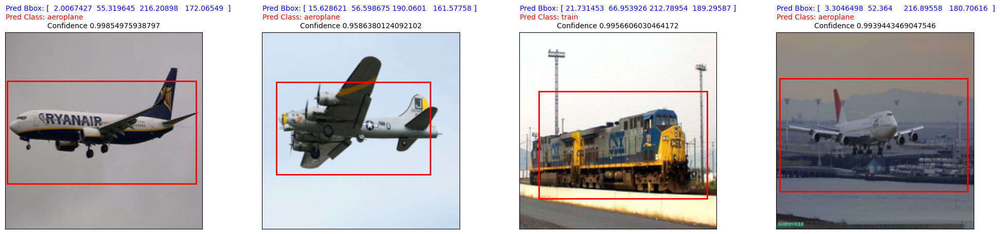

In [ ]:
# Visualize predictions after training
print("Predictions after training:")
visualize_predictions(model, testloader, voc_classes, num_images=6)

**More tests on random files**

In [81]:
from google.colab import files
uploaded = files.upload()

# Assuming you uploaded a single image, get its filename
filename = next(iter(uploaded.keys()))
print(f"Uploaded file: {filename}")


Saving bicycle.jpeg to bicycle (2).jpeg
Uploaded file: bicycle (2).jpeg


In [94]:
from PIL import Image
from torchvision import transforms

# Define the same transform as used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Open the uploaded image and apply the transform
image = Image.open(filename).convert("RGB")  # Convert to RGB to ensure 3 channels
image_tensor = transform(image).unsqueeze(0)  # Add a batch dimension
image_tensor = image_tensor.to(device)  # Move the tensor to the same device as the model


In [95]:
model.eval()

# Run the model on the image tensor
with torch.no_grad():
    cls_outputs, bbox_outputs = model(image_tensor)

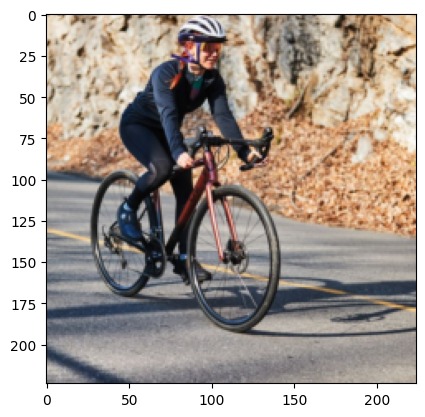

In [96]:
probs = torch.softmax(cls_outputs, dim=1)
bboxes = bbox_outputs[0].cpu().numpy()

image_np = image_tensor[0].cpu().numpy().transpose(1, 2, 0)
image_np = (image_np * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
image_np = np.clip(image_np, 0, 1)

fig, ax = plt.subplots(1)
ax.imshow(image_np)
confidence = torch.max(probs).item()  # Confidence is the maximum probability

if confidence >= 0.8:
  xmin, ymin, xmax, ymax = bboxes
  rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
  ax.add_patch(rect)
  label = torch.argmax(probs).item()
  class_name = voc_classes[label]
  ax.text(xmin, ymin - 5, f'{class_name} (Confidence: {confidence:.2f})', color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

# Show the plot
plt.show()


**Video processing**

In [ ]:
import cv2
from PIL import Image
import torch
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

def process_frame_with_model(frame, model, device, transform, voc_classes):
    # Convert BGR frame (from cv2) to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Convert the numpy frame to PIL Image
    pil_image = Image.fromarray(rgb_frame)

    # Transform the image for the model
    input_tensor = transform(pil_image).unsqueeze(0).to(device)

    # Get predictions from the model
    with torch.no_grad():
        cls_outputs, bbox_outputs = model(input_tensor)

    # Assuming single class prediction for simplicity
    # Loop through all predictions to draw bounding boxes and class names
    for i in range(len(bbox_outputs)):
        bbox = bbox_outputs[i].cpu().numpy()
        class_index = torch.argmax(cls_outputs[i], dim=0).item()
        class_name = voc_classes[class_index]
        probs = torch.softmax(cls_outputs[i], dim=0)
        confidence = torch.max(probs).item()

        # Transform bbox coordinates back to original frame size
        width, height = pil_image.size
        scale_x, scale_y = frame.shape[1] / width, frame.shape[0] / height
        xmin, ymin, xmax, ymax = bbox * [scale_x, scale_y, scale_x, scale_y]
        if(confidence >= 0.75):
        # Draw bounding boxes and class names on the frame
          cv2.rectangle(frame, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
          cv2.putText(frame, class_name, (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)

    return frame

# Model and device setup
model.eval()  # Set the model to evaluation mode

# Transform setup for frame processing
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Process Video
def process_video(input_video_path, output_video_path, model, device, transform, voc_classes):
    cap = cv2.VideoCapture(input_video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)

    # Fixed dimensions for the output video
    output_width, output_height = 224, 224

    # Define the codec and create VideoWriter object with fixed dimensions
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (output_width, output_height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Resize frame to the model's input size before processing
        resized_frame = cv2.resize(frame, (output_width, output_height))

        # Process the resized frame through the model
        processed_frame = process_frame_with_model(resized_frame, model, device, transform, voc_classes)

        # Write the processed frame into the file 'output_video_path'
        out.write(processed_frame)

    cap.release()
    out.release()


In [ ]:
# Example usage
input_video_path = 'trains_airpleans_test.mp4'
output_video_path = 'trains_airpleans_result.mp4'
process_video(input_video_path, output_video_path, model, device, transform, voc_classes)